In [1]:
from pylab import *
import random
%matplotlib inline
from JSAnimation import IPython_display
from matplotlib import animation

In [2]:
def rk4(ec,p_ini,x,args=0,h=0.01):
    if (x[1]-x[0])<=5*h:
        h=(x[1]-x[0])/10
    tiempos = arange(x[0],x[1]+h,h)
    sol = zeros((len(tiempos),len(p_ini)))
    sol[0,:] = p_ini
    if args==0:
        for i in xrange (len(tiempos)-1):
            k1 = ec(sol[i,:],tiempos[i])
            k2 = ec(sol[i,:]+0.5*h*k1,tiempos[i]+0.5*h)
            k3 = ec(sol[i,:]+0.5*h*k2,tiempos[i]+0.5*h)
            k4 = ec(sol[i,:]+h*k3,tiempos[i]+h)
            sol[i+1,:]=sol[i,:]+(h/6.)*(k1+2*k2+2*k3+k4)
    else:
         for i in xrange (len(tiempos)-1):
            k1 = ec(sol[i,:],tiempos[i],args)
            k2 = ec(sol[i,:]+0.5*h*k1,tiempos[i]+0.5*h,args)
            k3 = ec(sol[i,:]+0.5*h*k2,tiempos[i]+0.5*h,args)
            k4 = ec(sol[i,:]+h*k3,tiempos[i]+h,args)
            sol[i+1,:]=sol[i,:]+(h/6.)*(k1+2*k2+2*k3+k4)
    
    return tiempos,sol

In [3]:
def mov_p(r_v,t,g=0,m=1):
    dx=r_v[2]
    dy=r_v[3]
    dvx,dvy=0,-g
    return array([dx,dy,dvx,dvy])

In [4]:
def rebote_b(rv_i,mi_dt,b):
    dt_b=(mi_dt)/2
    y_izq=rv_i
    t,sol=rk4(mov_p,rv_i,[0,dt_b])
    y_med=sol[-1,:]
    r1=sqrt((y_izq[0])**2+(y_izq[1])**2)
    while r1>b:
        reini=y_med
        dt_b=dt_b/2
        t,sol=rk4(mov_p,reini,[0,dt_b])
        y_izq=reini
        y_med=sol[-1,:]
        r1=sqrt((y_izq[0])**2+(y_izq[1])**2)
    n=-y_izq[0],-y_izq[1]
    omega=arccos((-n[0]*y_izq[2]-n[1]*y_izq[3])/(sqrt(y_izq[2]**2+y_izq[3]**2)*sqrt(n[0]**2+n[1]**2)))
        
    vt=n[1],-n[0]
    gamma=arccos((-vt[0]*y_izq[2]-vt[1]*y_izq[3])/(sqrt(y_izq[2]**2+y_izq[3]**2)*sqrt(vt[0]**2+vt[1]**2)))
       
    
    if gamma>(pi/2): 
        omega=-omega
    else:        
        omega=omega    
    rot_v=-cos(2*omega)*(y_izq[2])+sin(2*omega)*(y_izq[3])
    rot_n=-sin(2*omega)*(y_izq[2])-cos(2*omega)*(y_izq[3])
    y_izq=array([y_izq[0],y_izq[1],rot_v,rot_n])  
    return y_izq


def rebote_a(rv_i,mi_dt,b):
    dt_b=(mi_dt)/2
    y_izq=rv_i
    t,sol=rk4(mov_p,rv_i,[0,dt_b])
    y_med=sol[-1,:] 
    r1=sqrt((y_izq[0])**2 + (y_izq[1])**2)
    while r1<a: 
        reini=y_med
        dt_b=dt_b/2
        t,sol=rk4(mov_p,reini,[0,dt_b])
        y_izq=reini
        y_med=sol[-1,:]
        r1=sqrt((y_izq[0])**2+(y_izq[1])**2)
    n=-y_izq[0],-y_izq[1]
    omega=arccos((-n[0]*y_izq[2]-n[1]*y_izq[3])/(sqrt(y_izq[2]**2+y_izq[3]**2)*sqrt(n[0]**2+n[1]**2)))
    
    vt=n[1],-n[0]
    gamma=arccos((-vt[0]*y_izq[2]-vt[1]*y_izq[3])/(sqrt(y_izq[2]**2+y_izq[3]**2)*sqrt(vt[0]**2+vt[1]**2)))
        
    if gamma>(pi/2):
        omega=-omega
    else:        
        omega=omega    
    rot_v=-cos(2*omega)*(y_izq[2])+sin(2*omega)*(y_izq[3])
    rot_n=-sin(2*omega)*(y_izq[2])-cos(2*omega)*(y_izq[3]) 
    y_izq=array([y_izq[0],y_izq[1],rot_v,rot_n])   
    return y_izq

def cc(x,y,vx,vy,N,g,a,b): 
    R=0 
    ini=[x,y,vx,vy]
    trayectoria=zeros((N,len(ini)))
    mi_dt=0.01
    trayectoria[0,:]=array(ini)
    for i in range(N-1):
        t,sol_dt=rk4(mov_p,trayectoria[i,:],[0,mi_dt],g) 
        r=sqrt((sol_dt[-1,:][1])**2+(sol_dt[-1,:][0])**2)
        if r>b: 
            p=rebote_b(trayectoria[i,:],mi_dt,b)
            trayectoria[i+1,:]=p
            R +=1
        else:
            trayectoria[i+1,:]=sol_dt[-1,:]      
        if r<a:
            p=rebote_a(trayectoria[i,:],mi_dt,a)
            trayectoria[i+1,:]=p
            R +=1 

    return trayectoria[:,0],trayectoria[:,1],trayectoria[:,2],trayectoria[:,3]

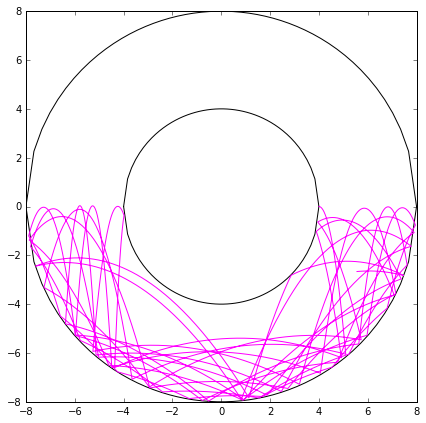

In [5]:
fig=figure(figsize=(7,7))
xlim([-8,8]),ylim([-8,8])
a=4
b=2*a 
sol=cc(4,0,1,0,5000,10,a,b) 

x,y,u,v=linspace(-b,b),linspace(-b,b),linspace(-a,a),linspace(-a,a)
plot(x,sqrt(-x**2+b**2),'black')
plot(y,-sqrt(-y**2+b**2),'black')
plot(u,sqrt(-u**2+a**2),'black')
plot(v,-sqrt(-v**2+a**2),'black')
plot(sol[0],sol[1],color='magenta')
show()


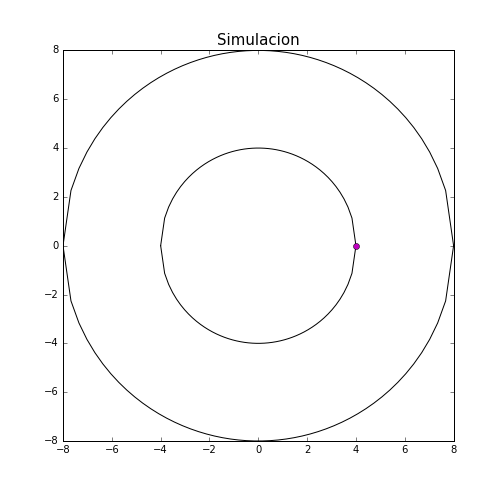
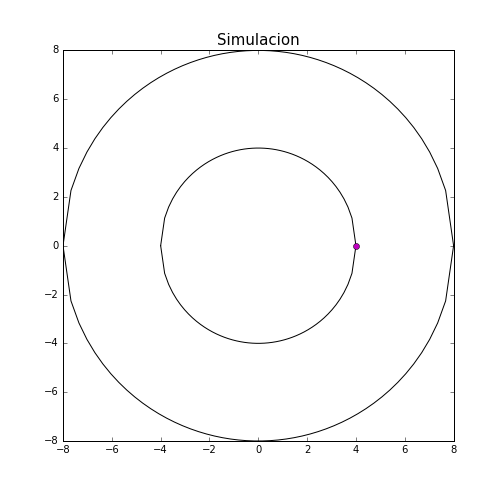
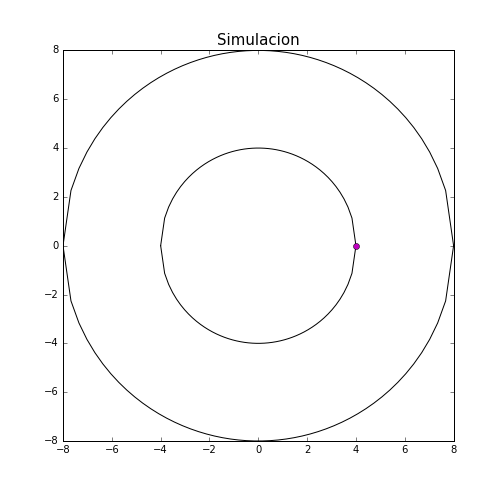
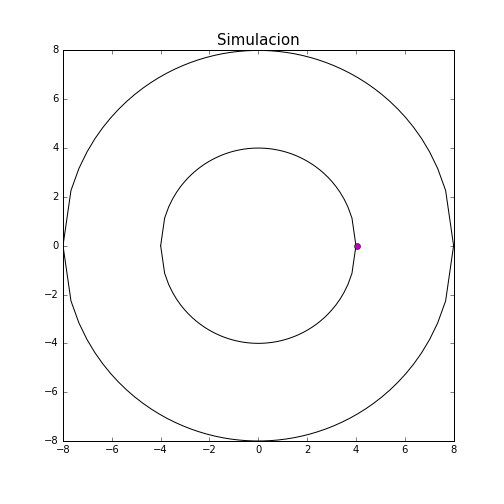
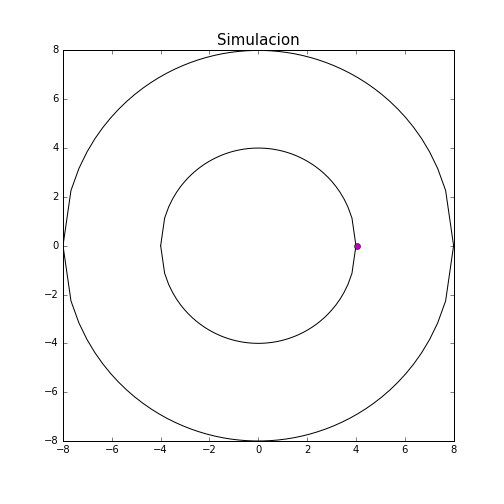
...
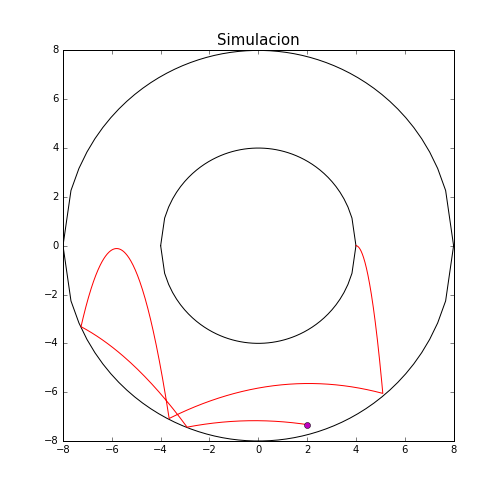
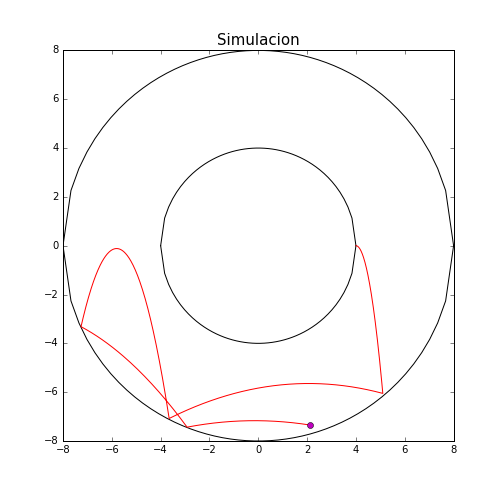
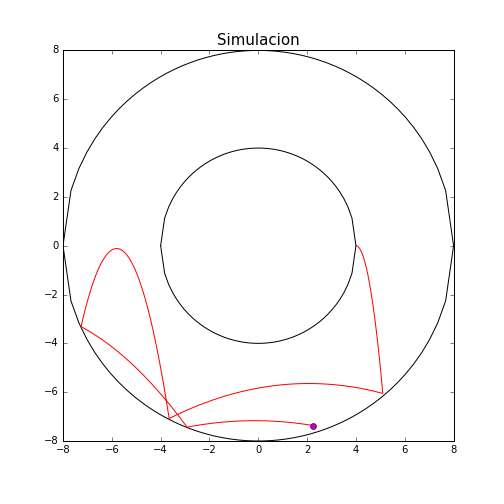
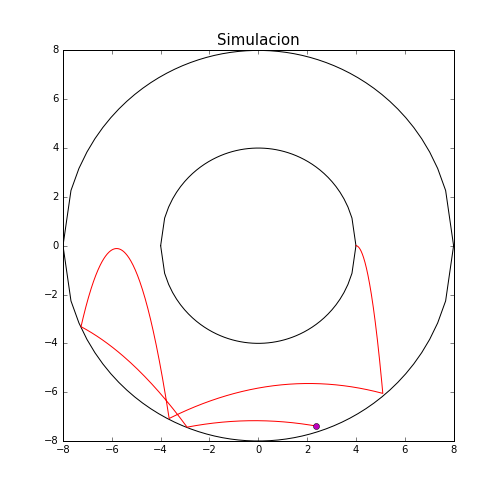
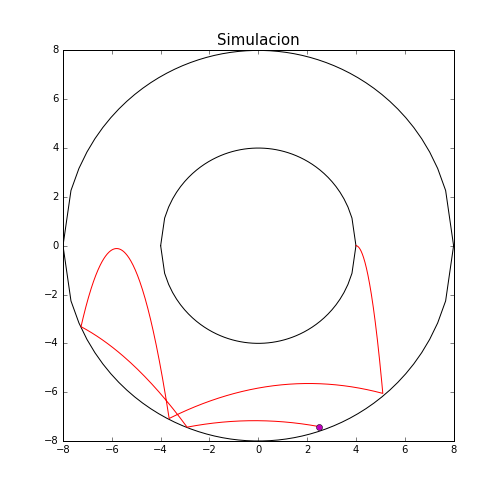

In [9]:
fig=figure(figsize=(7,7))
ejes=axes(xlim=(-8,8),ylim=(-8,8))
circle,=ejes.plot(x,sqrt(-x**2+b**2),'black'),
plot(y,-sqrt(-y**2+b**2),'black'),
plot(u,sqrt(-u**2+a**2),'black'),
plot(v,-sqrt(-v**2+a**2),'black')
title('Simulacion',fontsize=15)
trayectoria,=ejes.plot([],[],color='m')
punto,=ejes.plot([],[],'o',color='b')

def init():
    trayectoria.set_data([],[])
    punto.set_data([],[])
    return trayectoria,punto,
def el_mov(i):
    y,v=sol[0],sol[1]
    trayectoria.set_data(y[:i+1],v[:i+1])
    punto.set_data(y[i],v[i])
    return trayectoria,punto,
animation.FuncAnimation(fig,el_mov,init_func=init,frames=500)